In [1]:
import pandas as pd
import numpy as np
import scanpy as sc
import anndata as ad
import scipy.io
import matplotlib.pyplot as plt
import os
from matplotlib.colors import ListedColormap, TwoSlopeNorm
import warnings
warnings.filterwarnings("ignore")

os.environ["CUDA_VISIBLE_DEVICES"] = "4"

import sys
sys.path.append(r'/home/yzengbj/my_project/code/')
import SVF

In [2]:
RAW_PATH = "/home/yzengbj/my_project/data/Mouth_brain_visium" # Raw data
DATA_PATH = "/home/yzengbj/factor/data/Mouth_brain_visium" # Raw data
SAVE_PATH = "/home/yzengbj/factor/results/Mouth_brain_visium" # Deconvolution results
FIG_PATH = "/import/home2/share/yqzeng/MacSPG/experiments/mouth_brain_visium/figs" # Figures
os.makedirs(os.path.join(DATA_PATH), exist_ok = True)
os.makedirs(os.path.join(SAVE_PATH), exist_ok = True)

In [3]:
adata_1 = sc.read_h5ad(os.path.join(SAVE_PATH, "adata_result_visium_1.h5ad"))
adata_2 = sc.read_h5ad(os.path.join(SAVE_PATH, "adata_result_visium_2.h5ad"))

In [4]:
adata_1.obsm['spatial'][:,1] = - adata_1.obsm['spatial'][:,1]
adata_2.obsm['spatial'][:,1] = - adata_2.obsm['spatial'][:,1]

In [5]:
factors_1 = adata_1.obsm['factor']
loadings_1 = adata_1.varm['loading']
factors_2 = adata_2.obsm['factor']
loadings_2 = adata_2.varm['loading']

In [ ]:
ct_plot = [
 'Ext_Amy_2',
 'Ext_Hpc_CA1',
 'Ext_Hpc_CA3',
 'Ext_Hpc_DG1',
 'Ext_L5_2',
 'Ext_Med',
 'Ext_Thal_1',
 'Ext_Thal_2',
 'Inh_1',
 'Inh_4',
  'Ext_L23',
 ]

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
from scipy.stats import pearsonr
from libpysal.weights import KNN
import matplotlib as mpl

mpl.rcParams.update({
    'font.family': 'Helvetica', 
    'font.size': 7,
    'axes.titlesize': 8,
    'axes.labelsize': 7,
    'xtick.labelsize': 6.5,
    'ytick.labelsize': 6.5,
    'axes.linewidth': 0.5,
    'xtick.major.width': 0.5,
    'ytick.major.width': 0.5,
    'xtick.major.size': 2.5,
    'ytick.major.size': 2.5,
    'pdf.fonttype': 42,
    'ps.fonttype': 42,
    'savefig.dpi': 300,
    'figure.dpi': 150,
})

In [8]:
n_ct = len(ct_plot)
pearson_vals = []
for ct in ct_plot:
    pearson_val, _ = pearsonr(loadings_1[ct], loadings_2[ct])
    pearson_vals.append(abs(pearson_val))


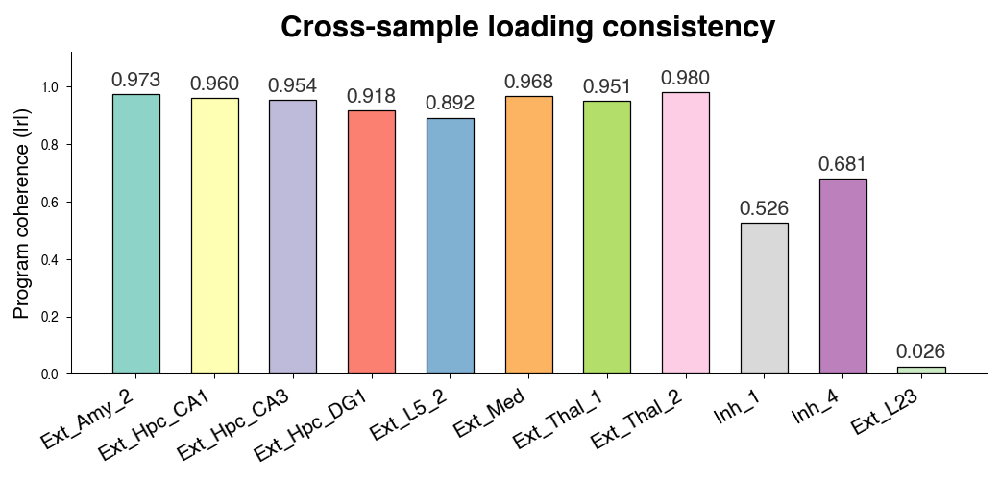

In [31]:
fig, ax = plt.subplots(figsize=(8.2, 2.9), gridspec_kw={'hspace': 0.45})

palette = sns.color_palette('Set3', n_ct)

bars = ax.bar(
    range(n_ct), pearson_vals,
    color=palette, edgecolor='black', linewidth=0.6,
    width=0.6,
)

ax.set_xticks(range(n_ct))
ax.set_xticklabels(ct_plot, rotation=30, ha='right', fontsize=10)
ax.set_ylabel('Program coherence (|r|)', fontsize=10)
ax.set_title('Cross-sample loading consistency', fontsize=15,
             fontweight='bold', pad=8)
ax.set_ylim(0, 1.12)
ax.set_yticks(np.arange(0, 1.2, 0.2))

for idx, val in enumerate(pearson_vals):
    ax.text(idx, val + 0.015, f'{val:.3f}',
            ha='center', va='bottom', fontsize=10, color='#333333')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)


plt.tight_layout()
plt.savefig('cross_sample_loading_consistency_legend.pdf',
            bbox_inches='tight', pad_inches=0.05)
plt.show()

In [18]:
ct_show = ['Ext_L23', 'Ext_L5_1', 'Ext_Pir', 'Inh_1', 'Inh_4']

In [ ]:
ct_show = [
 'Ext_Amy_2',
 'Ext_Hpc_CA1',
 'Ext_Hpc_CA3',
 'Ext_Hpc_DG1',
 'Ext_L5_2',
 'Ext_Med',
 'Ext_Thal_1',
 'Ext_Thal_2',
 'Inh_1',
 'Inh_4',
 ]

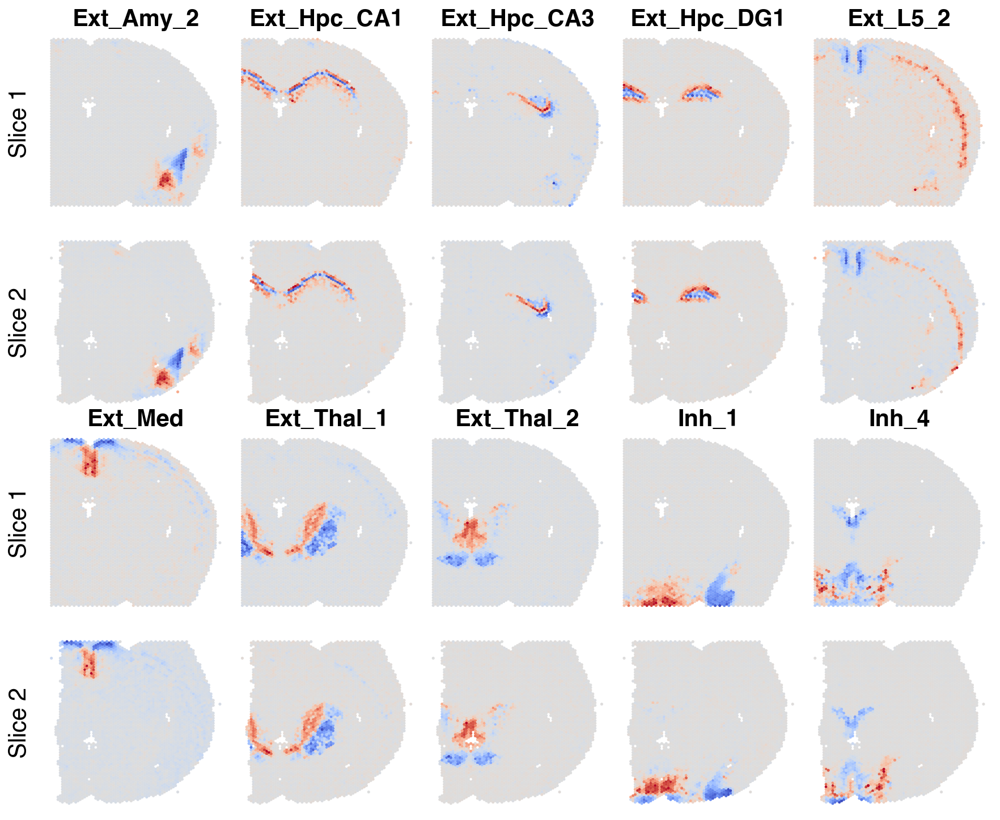

In [22]:
n_celltypes = len(ct_show)
nrows, ncols = 4, 5

fig, axes = plt.subplots(
    nrows, ncols,
    figsize=(14.4, 12.0),
    gridspec_kw={'wspace': 0.03, 'hspace': 0.08}
)

cmap = 'coolwarm'

slice_info = [
    (0, adata_1, factors_1),
    (1, adata_2, factors_2),
    (2, adata_1, factors_1),
    (3, adata_2, factors_2),
]

for row, adata, factors in slice_info:
    ct_offset = 0 if row <= 1 else 5
    for col in range(ncols):
        ct_idx = ct_offset + col
        ax = axes[row, col]
        if ct_idx >= n_celltypes:
            ax.set_visible(False)
            continue

        ct = ct_show[ct_idx]
        data = factors[ct].to_numpy()
        if ct in ['Ext_Amy_2', 'Ext_Med', 'Ext_Thal_1'] and row in [1, 3]:
            data = -data
        norm_i = mpl.colors.TwoSlopeNorm(vcenter=0.0)

        ax.scatter(
            adata.obsm["spatial"][:, 0],
            -adata.obsm["spatial"][:, 1],
            c=data,
            s=6,
            cmap=cmap,
            norm=norm_i,
            linewidths=0,
            rasterized=False,
        )

        if row in [0, 2]:
            ax.set_title(ct, fontsize=20, fontweight='bold', pad=4)

        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_aspect('equal', adjustable='box')
        for spine in ax.spines.values():
            spine.set_visible(False)

row_labels = ['Slice 1', 'Slice 2', 'Slice 1', 'Slice 2']
for row, label in enumerate(row_labels):
    axes[row, 0].set_ylabel(label, fontsize=20, labelpad=10)

plt.savefig('factor_scores_spatial_combined.pdf',
            bbox_inches='tight', pad_inches=0.05)
# plt.savefig('factor_scores_spatial_combined.png',
#             bbox_inches='tight', pad_inches=0.05, dpi=300)
plt.show()

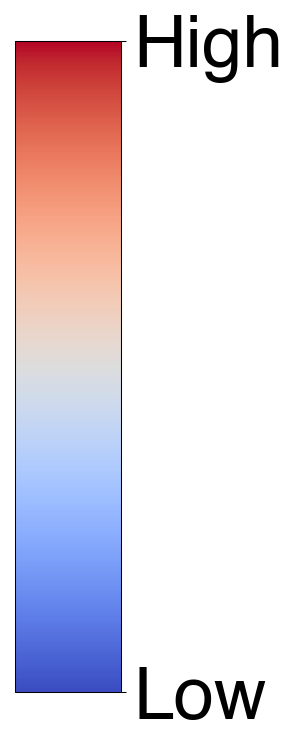

In [52]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors

fig, ax = plt.subplots(figsize=(2, 5))  # 竖向；横向可用 figsize=(5, 1)
cmap = cm.coolwarm
norm = mcolors.Normalize(vmin=0, vmax=1)  # 根据你的数据范围调整
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

cbar = fig.colorbar(sm, cax=ax, orientation='vertical')  # 横向改为 'horizontal'
cbar.set_ticks([0, 1])  # 按需设置刻度
cbar.set_ticklabels(['Low', 'High'])  # 按需设置标签
cbar.ax.tick_params(labelsize=35)  # 调整刻度标签大小
#cbar.set_label('Normalized variation', fontsize=20)

plt.tight_layout()
plt.savefig(os.path.join("Normalized variation.pdf"))
plt.show()

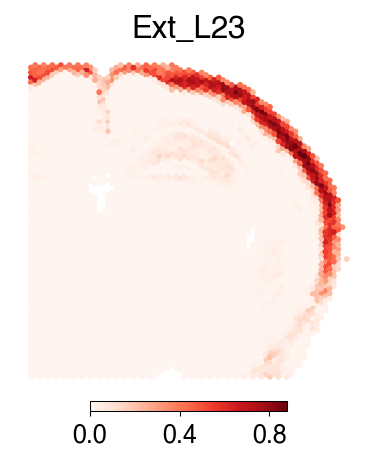

In [64]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from matplotlib.ticker import MaxNLocator

ct = 'Ext_L23'  
data = adata_1.obsm['proportion'][ct]

fig, ax = plt.subplots(figsize=(3.5, 3.2))

sc = ax.scatter(
    adata_1.obsm["spatial"][:, 0],
    -adata_1.obsm["spatial"][:, 1],
    c=data,
    s=8,
    cmap='Reds',
    linewidths=0
)
cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
cb.locator = MaxNLocator(nbins=1)
cb.update_ticks()
cb.ax.tick_params(labelsize=12)
#cb.set_label('Proportion', fontsize=12)

# 去掉边框
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_linewidth(False)
ax.spines['bottom'].set_linewidth(False)

ax.set_title(ct, fontsize=15)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

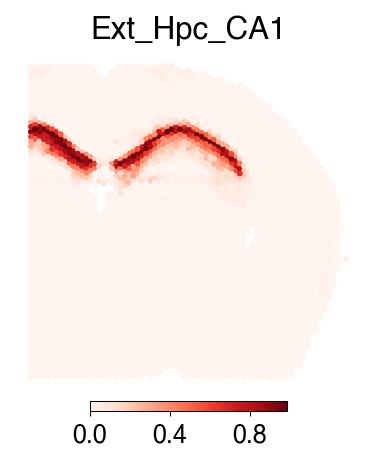

In [8]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from matplotlib.ticker import MaxNLocator

ct = 'Ext_Hpc_CA1'  
data = adata_1.obsm['proportion'][ct]

fig, ax = plt.subplots(figsize=(3.5, 3.2))

sc = ax.scatter(
    adata_1.obsm["spatial"][:, 0],
    -adata_1.obsm["spatial"][:, 1],
    c=data,
    s=8,
    cmap='Reds',
    linewidths=0
)
cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
cb.locator = MaxNLocator(nbins=1)
cb.update_ticks()
cb.ax.tick_params(labelsize=12)
#cb.set_label('Proportion', fontsize=12)

# 去掉边框
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_linewidth(False)
ax.spines['bottom'].set_linewidth(False)

ax.set_title(ct, fontsize=15)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

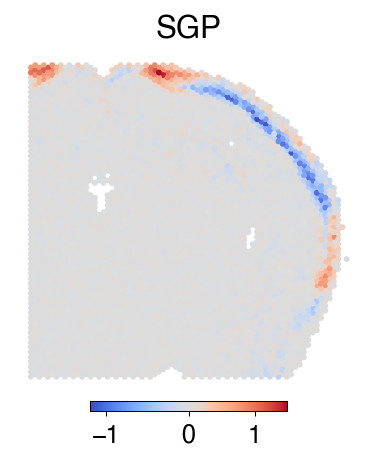

In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from matplotlib.ticker import MaxNLocator

ct = 'Ext_L23'  
data = factors_1[ct].to_numpy()

fig, ax = plt.subplots(figsize=(3.5, 3.2))
norm = mpl.colors.TwoSlopeNorm(vcenter=0.0)
sc = ax.scatter(
    adata_1.obsm["spatial"][:, 0],
    -adata_1.obsm["spatial"][:, 1],
    c=data,
    s=8,
    cmap='coolwarm',
    linewidths=0,
    norm=norm
)
cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
cb.locator = MaxNLocator(nbins=1)
cb.update_ticks()
cb.ax.tick_params(labelsize=12)
#cb.set_label('Proportion', fontsize=12)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_linewidth(False)
ax.spines['bottom'].set_linewidth(False)

ax.set_title('SGP', fontsize=15)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

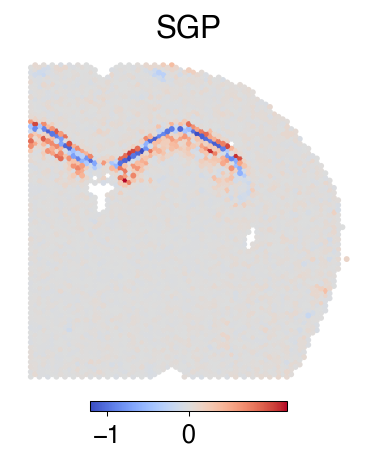

In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from matplotlib.ticker import MaxNLocator

ct = 'Ext_Hpc_CA1'  
data = factors_1[ct].to_numpy()

fig, ax = plt.subplots(figsize=(3.5, 3.2))
norm = mpl.colors.TwoSlopeNorm(vcenter=0.0)
sc = ax.scatter(
    adata_1.obsm["spatial"][:, 0],
    -adata_1.obsm["spatial"][:, 1],
    c=data,
    s=8,
    cmap='coolwarm',
    linewidths=0,
    norm=norm
)
cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
cb.locator = MaxNLocator(nbins=2)
cb.update_ticks()
cb.ax.tick_params(labelsize=12)
#cb.set_label('Proportion', fontsize=12)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_linewidth(False)
ax.spines['bottom'].set_linewidth(False)

ax.set_title('SGP', fontsize=15)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

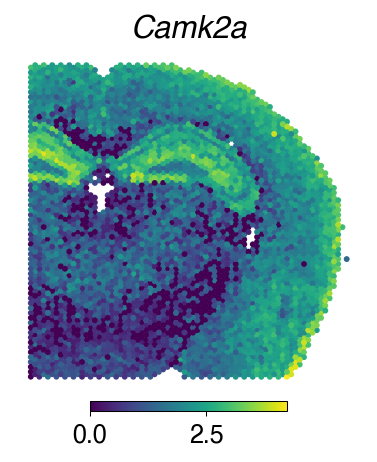

In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from matplotlib.ticker import MaxNLocator

ct = 'Ext_Hpc_CA1'  
data = adata_1[:, 'Camk2a'].X

fig, ax = plt.subplots(figsize=(3.5, 3.2))
norm = mpl.colors.TwoSlopeNorm(vcenter=0.0)
sc = ax.scatter(
    adata_1.obsm["spatial"][:, 0],
    -adata_1.obsm["spatial"][:, 1],
    c=data,
    s=8,
    cmap='viridis',
    linewidths=0,
    #norm=norm
)
cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
cb.locator = MaxNLocator(nbins=2)
cb.update_ticks()
cb.ax.tick_params(labelsize=12)
#cb.set_label('Proportion', fontsize=12)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_linewidth(False)
ax.spines['bottom'].set_linewidth(False)

ax.set_title('Camk2a', fontsize=15, fontstyle='italic')
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

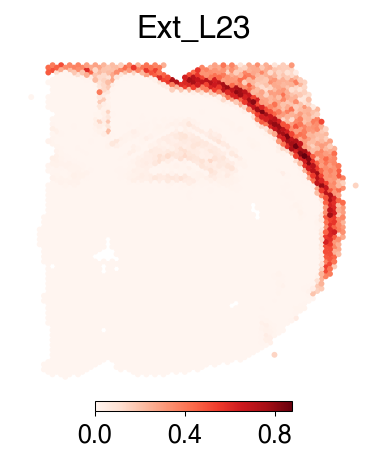

In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from matplotlib.ticker import MaxNLocator

ct = 'Ext_L23'  
data = adata_2.obsm['proportion'][ct]

fig, ax = plt.subplots(figsize=(3.5, 3.2))

sc = ax.scatter(
    adata_2.obsm["spatial"][:, 0],
    -adata_2.obsm["spatial"][:, 1],
    c=data,
    s=8,
    cmap='Reds',
    linewidths=0
)
cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
cb.locator = MaxNLocator(nbins=1)
cb.update_ticks()
cb.ax.tick_params(labelsize=12)
#cb.set_label('Proportion', fontsize=12)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_linewidth(False)
ax.spines['bottom'].set_linewidth(False)

ax.set_title(ct, fontsize=15)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

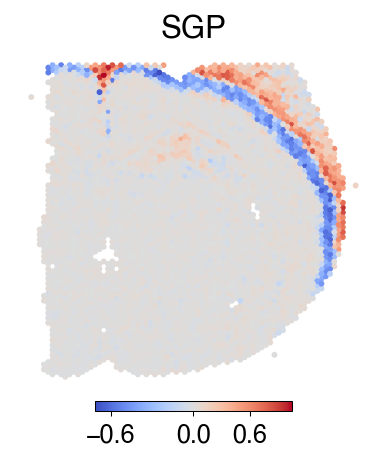

In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from matplotlib.ticker import MaxNLocator

ct = 'Ext_L23'  
data = factors_2[ct].to_numpy()

fig, ax = plt.subplots(figsize=(3.5, 3.2))
norm = mpl.colors.TwoSlopeNorm(vcenter=0.0)
sc = ax.scatter(
    adata_2.obsm["spatial"][:, 0],
    -adata_2.obsm["spatial"][:, 1],
    c=data,
    s=8,
    cmap='coolwarm',
    linewidths=0,
    norm=norm
)
cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
cb.locator = MaxNLocator(nbins=3)
cb.update_ticks()
cb.ax.tick_params(labelsize=12)
#cb.set_label('Proportion', fontsize=12)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_linewidth(False)
ax.spines['bottom'].set_linewidth(False)

ax.set_title('SGP', fontsize=15)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

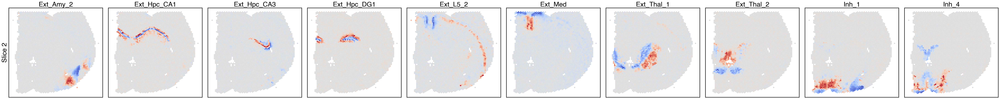

In [27]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

n_celltypes = len(ct_show)
nrows, ncols = 1, 10

fig, axes = plt.subplots(nrows, ncols, figsize=(60, 6))
cmap = 'coolwarm'

for i, ax in enumerate(axes.flat[:n_celltypes]):
    ct = ct_show[i]
    data = factors_2[ct].to_numpy()
    if ct in ['Ext_Amy_2', 'Ext_Med']:
        data = -data
    norm_i = mpl.colors.TwoSlopeNorm(vcenter=0.0)

    sca = ax.scatter(
        adata_2.obsm["spatial"][:, 0],
        -adata_2.obsm["spatial"][:, 1],
        c=data,
        s=20,
        cmap=cmap,
        norm=norm_i
    )
    ax.set_title(ct, fontsize=28)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal', adjustable='box')
    ax.spines['left'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['right'].set_linewidth(2)
    ax.spines['top'].set_linewidth(2)

axes[0].set_ylabel('Slice 2', fontsize=28)

fig.subplots_adjust(left=0.03, right=0.99, top=0.96, bottom=0.04,
                    wspace=0.06, hspace=0.05)
plt.show()

In [7]:
ct_out = ['Ext_Pir', 'Ext_L23']

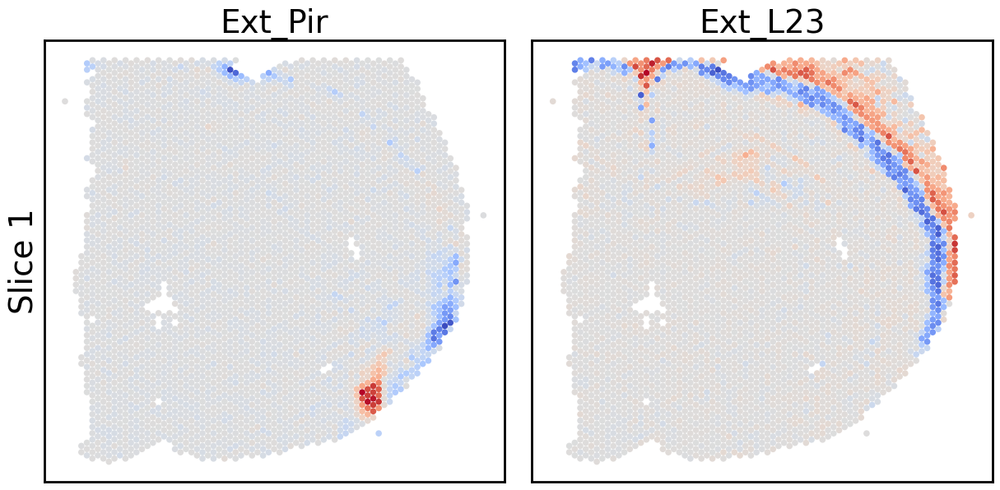

In [9]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

n_celltypes = len(ct_out)
nrows, ncols = 1, 2

fig, axes = plt.subplots(nrows, ncols, figsize=(12, 6))
cmap = 'coolwarm'

for i, ax in enumerate(axes.flat[:n_celltypes]):
    ct = ct_out[i]
    data = factors_2[ct].to_numpy()
    if ct in ['Ext_Amy_2', 'Ext_Med']:
        data = -data
    norm_i = mpl.colors.TwoSlopeNorm(vcenter=0.0)

    sca = ax.scatter(
        adata_2.obsm["spatial"][:, 0],
        -adata_2.obsm["spatial"][:, 1],
        c=data,
        s=20,
        cmap=cmap,
        norm=norm_i
    )
    ax.set_title(ct, fontsize=28)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal', adjustable='box')
    ax.spines['left'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['right'].set_linewidth(2)
    ax.spines['top'].set_linewidth(2)

axes[0].set_ylabel('Slice 1', fontsize=28)

fig.subplots_adjust(left=0.03, right=0.99, top=0.96, bottom=0.04,
                    wspace=0.06, hspace=0.05)
plt.show()

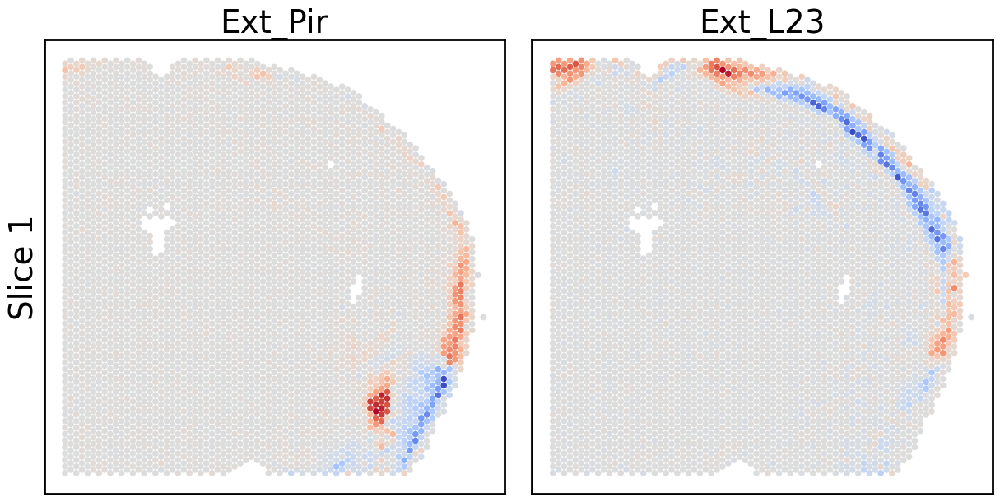

In [8]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

n_celltypes = len(ct_out)
nrows, ncols = 1, 2

fig, axes = plt.subplots(nrows, ncols, figsize=(12, 6))
cmap = 'coolwarm'

for i, ax in enumerate(axes.flat[:n_celltypes]):
    ct = ct_out[i]
    data = factors_1[ct].to_numpy()
    if ct in ['Ext_Amy_2', 'Ext_Med']:
        data = -data
    norm_i = mpl.colors.TwoSlopeNorm(vcenter=0.0)

    sca = ax.scatter(
        adata_1.obsm["spatial"][:, 0],
        -adata_1.obsm["spatial"][:, 1],
        c=data,
        s=20,
        cmap=cmap,
        norm=norm_i
    )
    ax.set_title(ct, fontsize=28)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal', adjustable='box')
    ax.spines['left'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['right'].set_linewidth(2)
    ax.spines['top'].set_linewidth(2)

axes[0].set_ylabel('Slice 1', fontsize=28)

fig.subplots_adjust(left=0.03, right=0.99, top=0.96, bottom=0.04,
                    wspace=0.06, hspace=0.05)
plt.show()

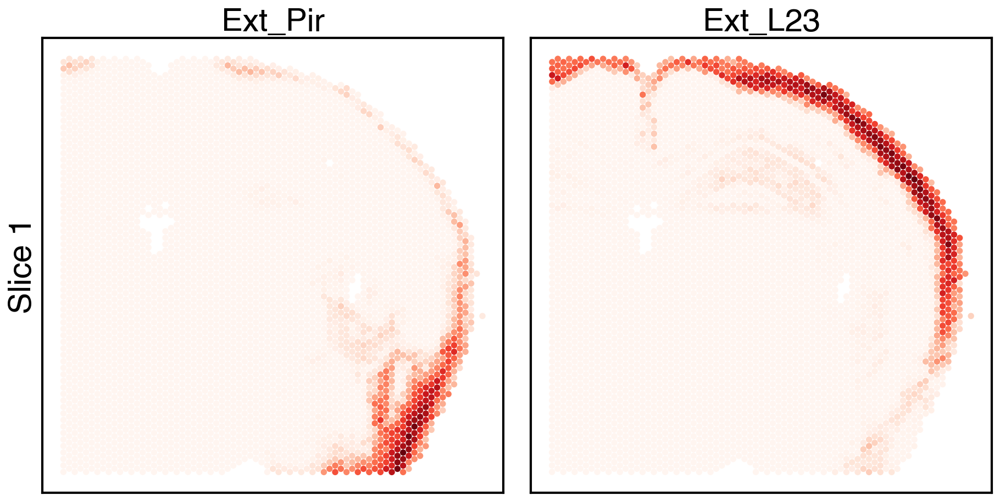

In [86]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

n_celltypes = len(ct_out)
nrows, ncols = 1, 2

fig, axes = plt.subplots(nrows, ncols, figsize=(12, 6))
cmap = 'Reds'

for i, ax in enumerate(axes.flat[:n_celltypes]):
    ct = ct_out[i]
    data = adata_1.obsm['proportion'][ct].to_numpy()
    sca = ax.scatter(
        adata_1.obsm["spatial"][:, 0],
        -adata_1.obsm["spatial"][:, 1],
        c=data,
        s=20,
        cmap=cmap,
    )
    ax.set_title(ct, fontsize=28)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal', adjustable='box')
    ax.spines['left'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['right'].set_linewidth(2)
    ax.spines['top'].set_linewidth(2)

axes[0].set_ylabel('Slice 1', fontsize=28)

fig.subplots_adjust(left=0.03, right=0.99, top=0.96, bottom=0.04,
                    wspace=0.06, hspace=0.05)
plt.show()

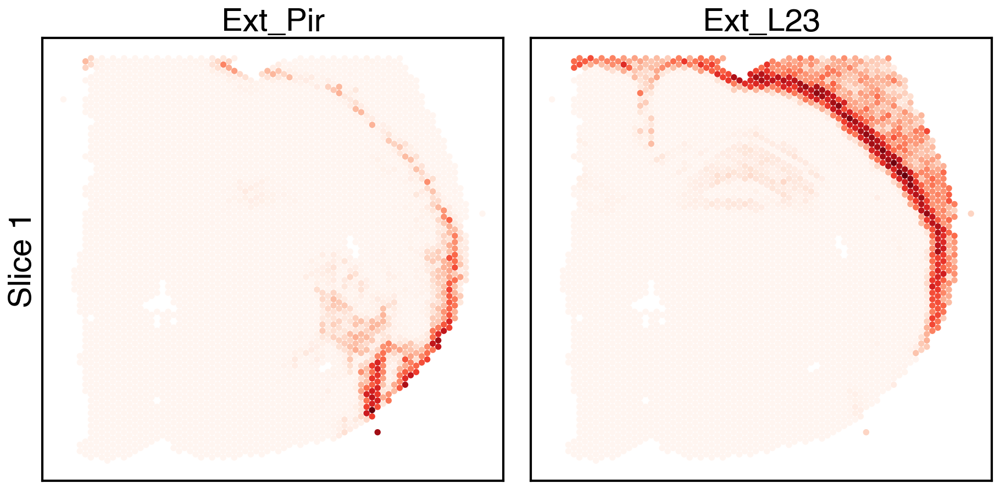

In [87]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

n_celltypes = len(ct_out)
nrows, ncols = 1, 2

fig, axes = plt.subplots(nrows, ncols, figsize=(12, 6))
cmap = 'Reds'

for i, ax in enumerate(axes.flat[:n_celltypes]):
    ct = ct_out[i]
    data = adata_2.obsm['proportion'][ct].to_numpy()
    sca = ax.scatter(
        adata_2.obsm["spatial"][:, 0],
        -adata_2.obsm["spatial"][:, 1],
        c=data,
        s=20,
        cmap=cmap,
    )
    ax.set_title(ct, fontsize=28)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal', adjustable='box')
    ax.spines['left'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['right'].set_linewidth(2)
    ax.spines['top'].set_linewidth(2)

axes[0].set_ylabel('Slice 1', fontsize=28)

fig.subplots_adjust(left=0.03, right=0.99, top=0.96, bottom=0.04,
                    wspace=0.06, hspace=0.05)
plt.show()